# Методы ансамблирования моделей


## Щущуть теории

Для того, чтобы оценить качество алгоритма можно воспользоваться следующим функционалом:

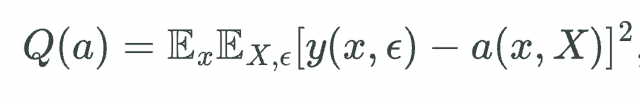

Где:

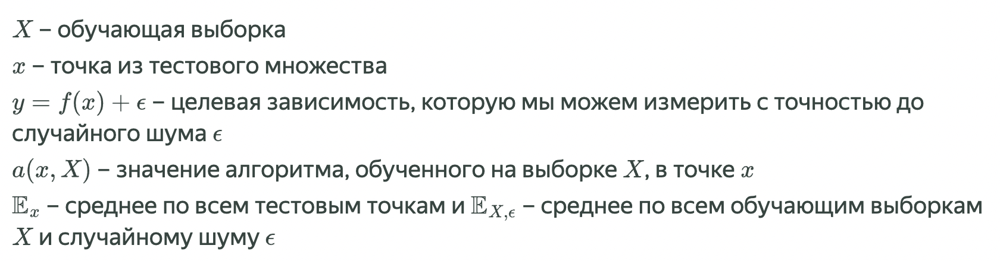

Однако сложно анализировать этот функционал в общем виде, поэтому мы разложим его на следующие состовляющие:

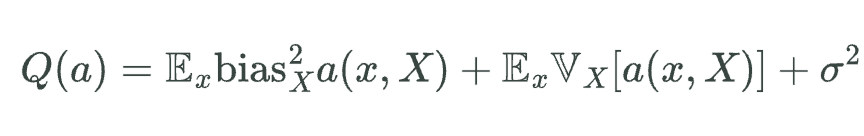

Где:

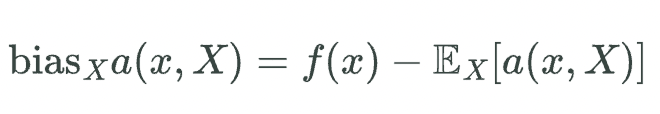

смещение предсказания алгоритма в точке x, усреднённого по всем возможным обучающим выборкам, относительно истинной зависимости f

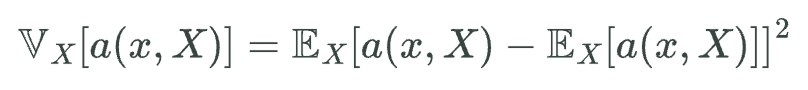

дисперсия (разброс) предсказаний алгоритма в зависимости от обучающей выборки X

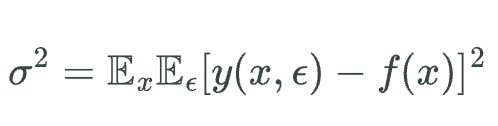

неустранимый шум в данных

## Бэггинг

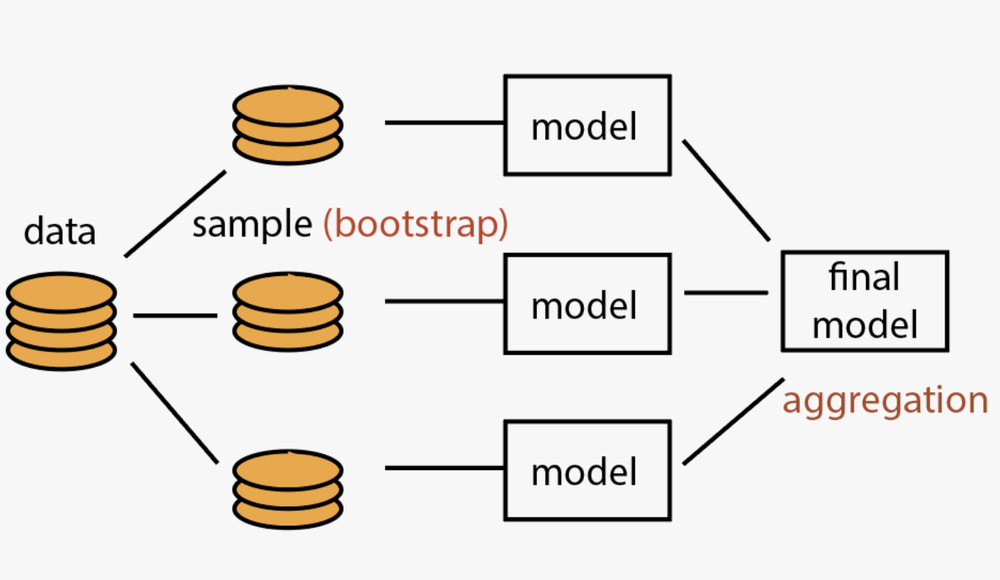

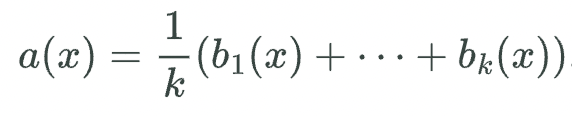

А что будет с состовляющими функционала ошибки?

Смещение ансамбля красиво сворачивается в смещение базового алгоритма:

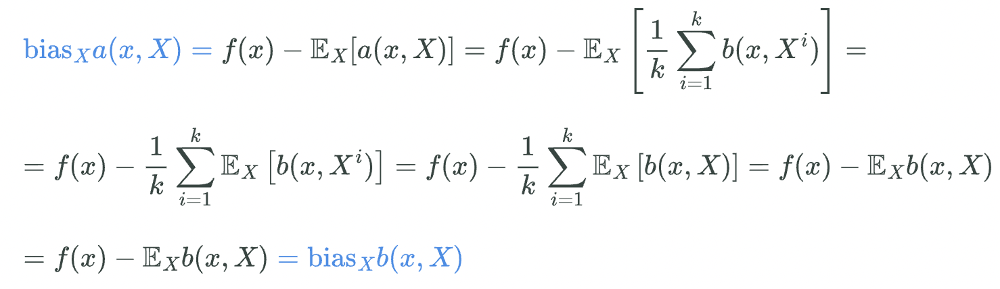

Разброс раскладывается на две состовляющие:

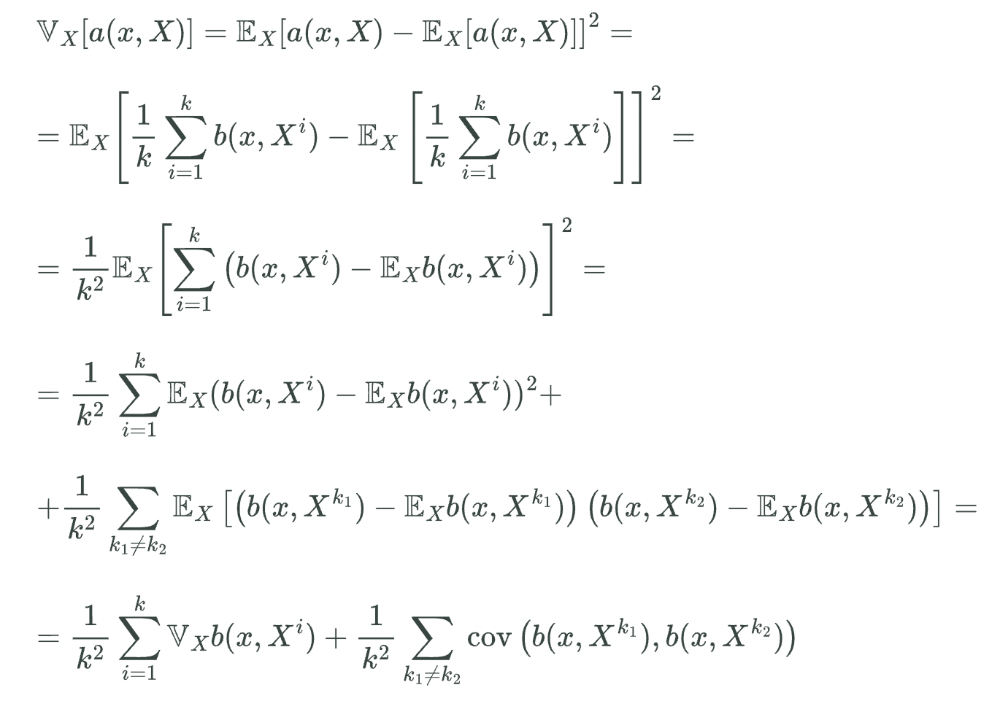

Но если предположить, что алгоритмы слабо коррелируемы:

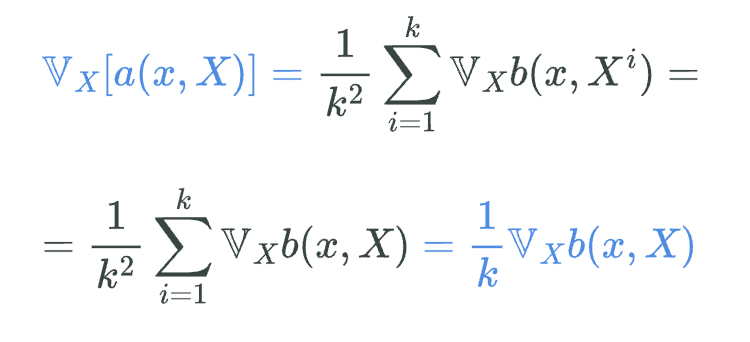

### Пример

Рассмотрим функцию 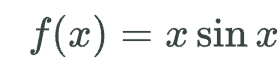, на которую наложим шум 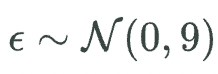


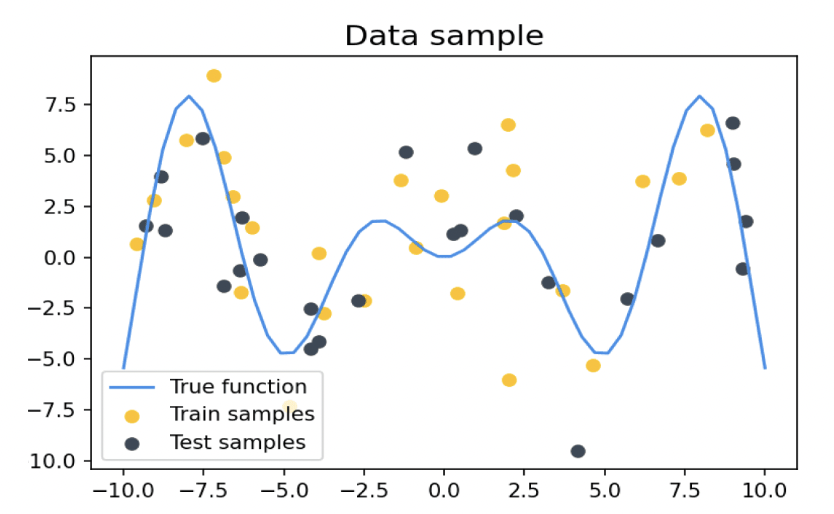

Сравним работу бэггинга против базового алгоритма на решающих деревьях:

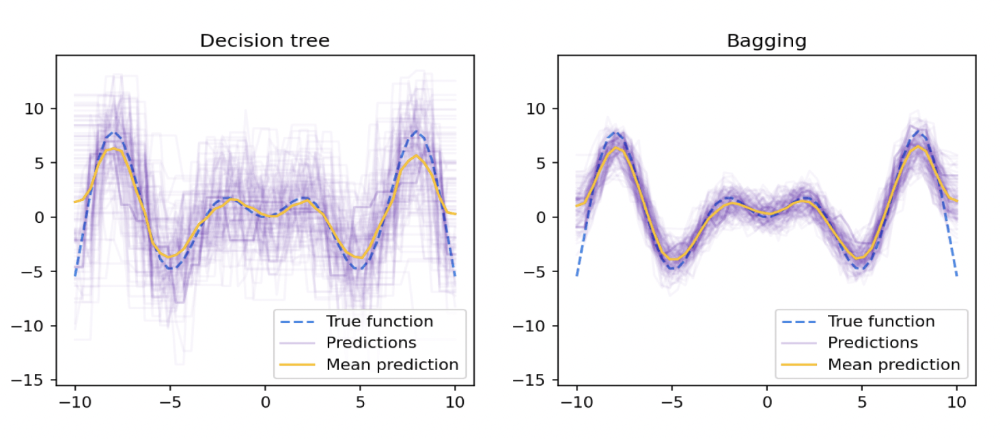

А что будет со смещением и разбросом?

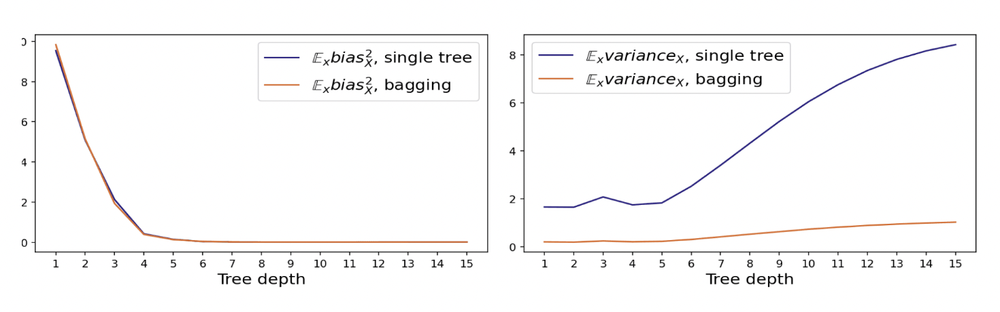

И кстати можно видеть, что формула разброса для слабокорреллируемых состовляющих пратически совпадает с практическими результатами

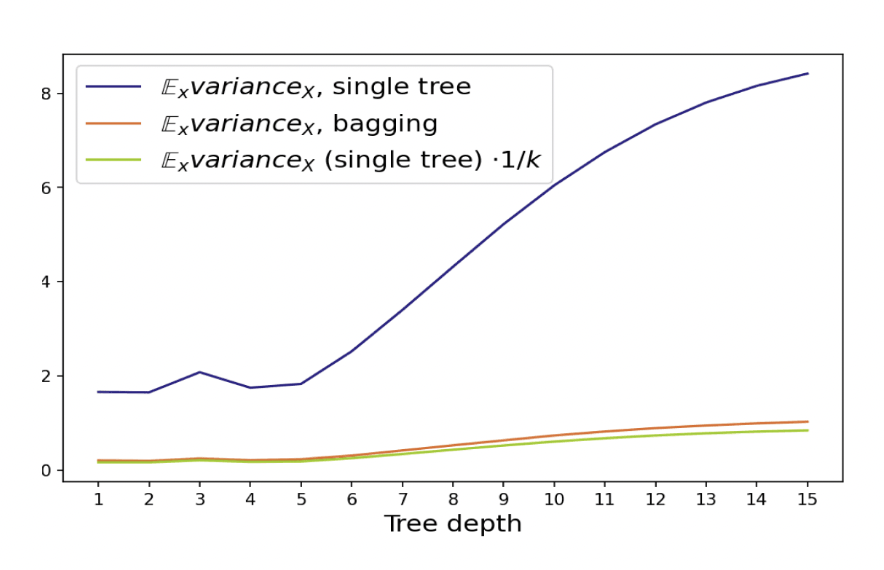

In [ ]:
X = [
    [1.0, 2.0, -1.1],
    [2.2, 0.4, -11.5]
] -> [
    [2.0, -1.1],
    [0.4, -11.5]
]

## Случайных лес

Случайный лес это вариант бэггинга, при котором мы стараемся снизить корреляцию между базовыми алгоритмами

Алгоритм выглядит так:

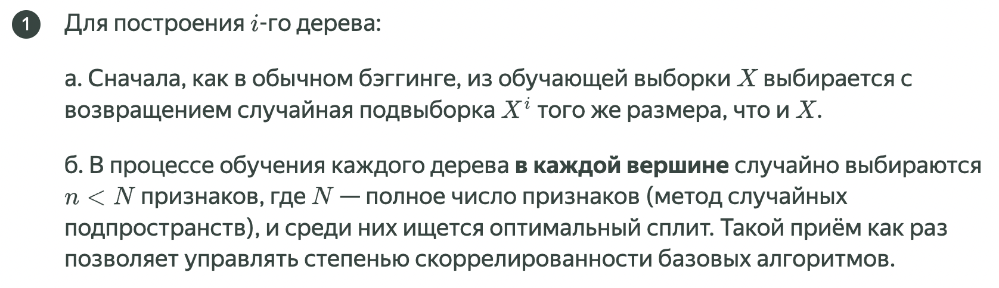

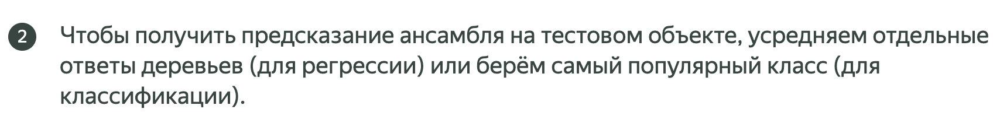

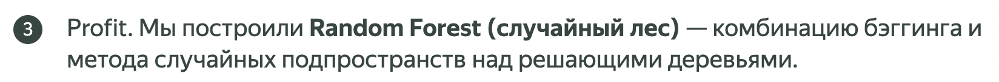

#### Some code time

In [34]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error
import numpy as np
import matplotlib.pyplot as plt



data = pd.read_csv('assets/UTKFACE_ALL.csv')

y = data['age'].values.astype('int32')
X = data[[f'x_{i}' for i in range(512)]].values
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)


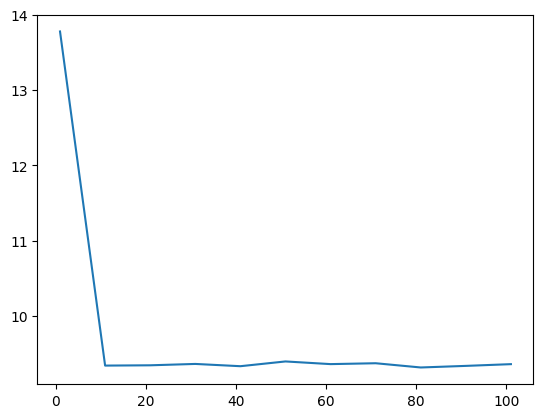

In [36]:
models = [RandomForestRegressor(max_depth=depth) for depth in np.arange(1, 102, 10)]
metrics = []
for model in models:
    model.fit(X_train[:1000], y_train[:1000])
    preds = model.predict(X_test)
    metrics.append(mean_absolute_error(preds, y_test))


plt.plot(np.arange(1, 102, 10), metrics)

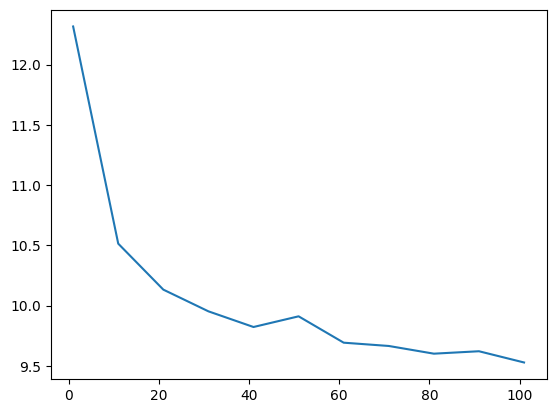

In [38]:
models = [RandomForestRegressor(max_features=n_feats) for n_feats in np.arange(1, 102, 10)]
metrics = []
for model in models:
    model.fit(X_train[:1000], y_train[:1000])
    preds = model.predict(X_test)
    metrics.append(mean_absolute_error(preds, y_test))


plt.plot(np.arange(1, 102, 10), metrics)

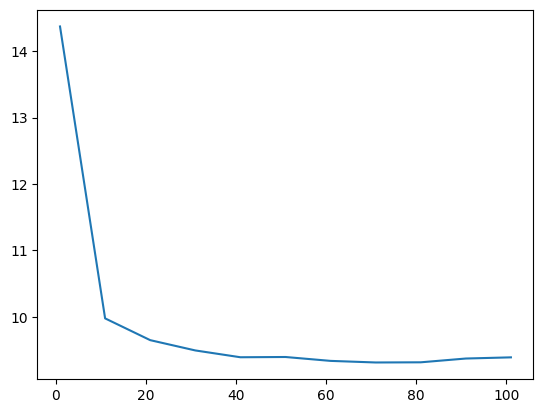

In [39]:
models = [RandomForestRegressor(n_estimators=n_estimators) for n_estimators in np.arange(1, 102, 10)]
metrics = []
for model in models:
    model.fit(X_train[:1000], y_train[:1000])
    preds = model.predict(X_test)
    metrics.append(mean_absolute_error(preds, y_test))


plt.plot(np.arange(1, 102, 10), metrics)

## Бустинг

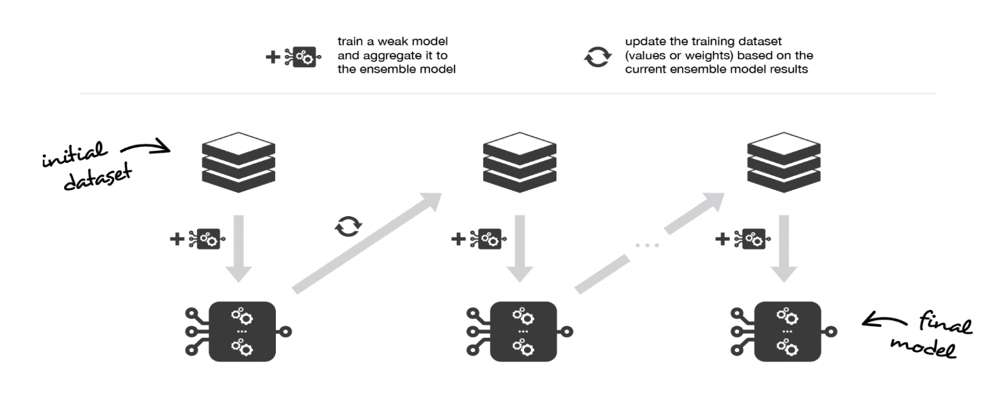

Попробуем разобрать алгоритм на примере задачи регрессии. Мы знаем, что регрессия минимизирует следующий функционал:

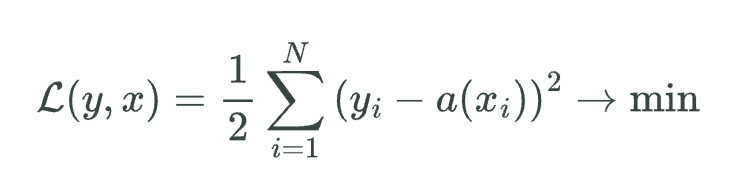

Наш ансамбль будет выглядить следующим образом (мы так хотим):

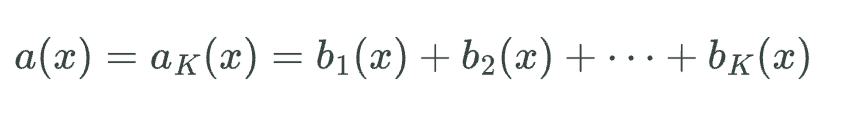

Предположим, наш первый алгоритм имеет вид 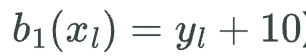 и если бы мы смогли обучить второй алгоритм, который бы выдавал -10, то хоба:

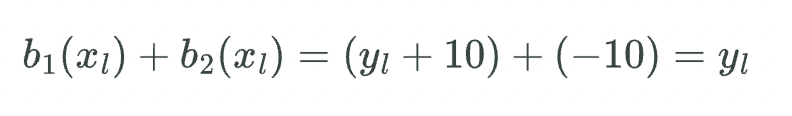

На самом деле бустинг можно представить как следующего пингвина:

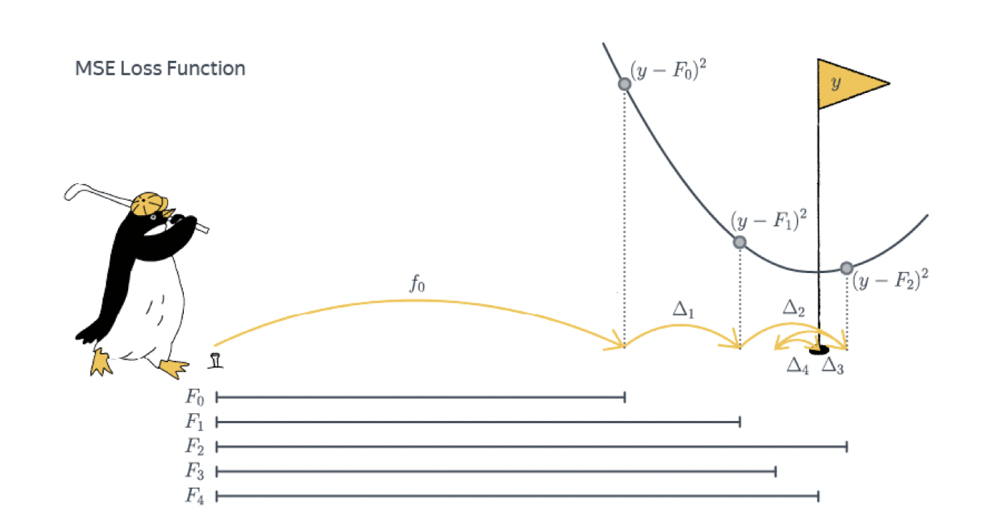

Если мы каждый раз будем уменьшать ошибку при обучении моделек на ошибках предыдущих, то должны получить такое:

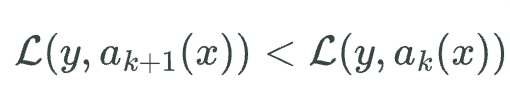

Также хорошая аналогия это ряд тейлора:

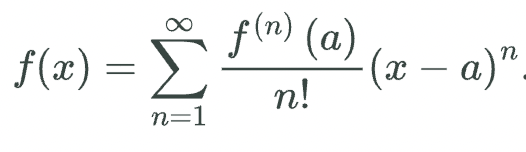

Итак, пусть мы обучили первый алгоритм:

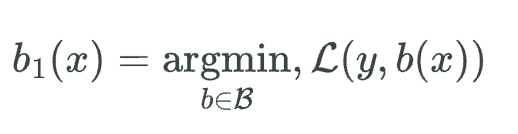

И вычислили ошибку:

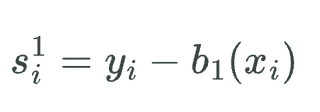

Если мы идеально обучим вторую модель под эти ошибки, то получим:

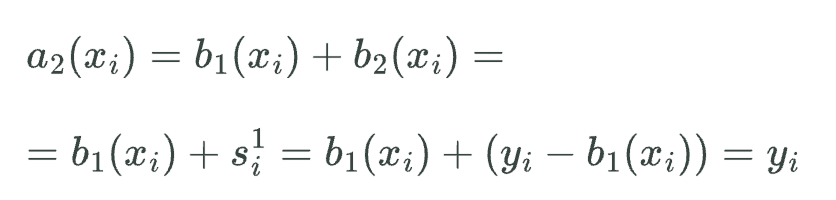

Но так не бывает :(

Поэтому продолжаем в том же духе

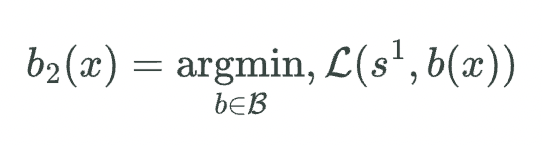

В общем случае ошибка имеет вид:

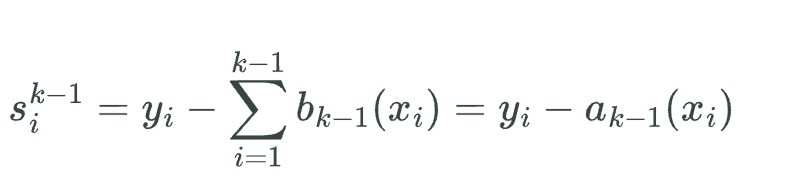

И следующий алгоритм имеет вид:

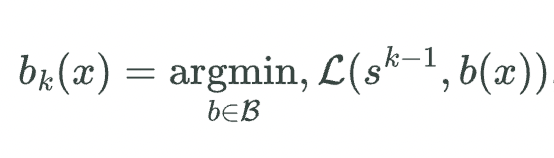

И ансамбль обновляется вот так:

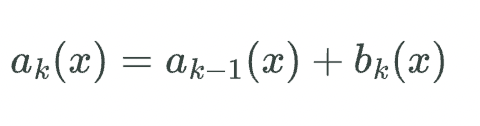

В итоге графически наш алгоритм выглядит как алгоритм градиентного спуска:

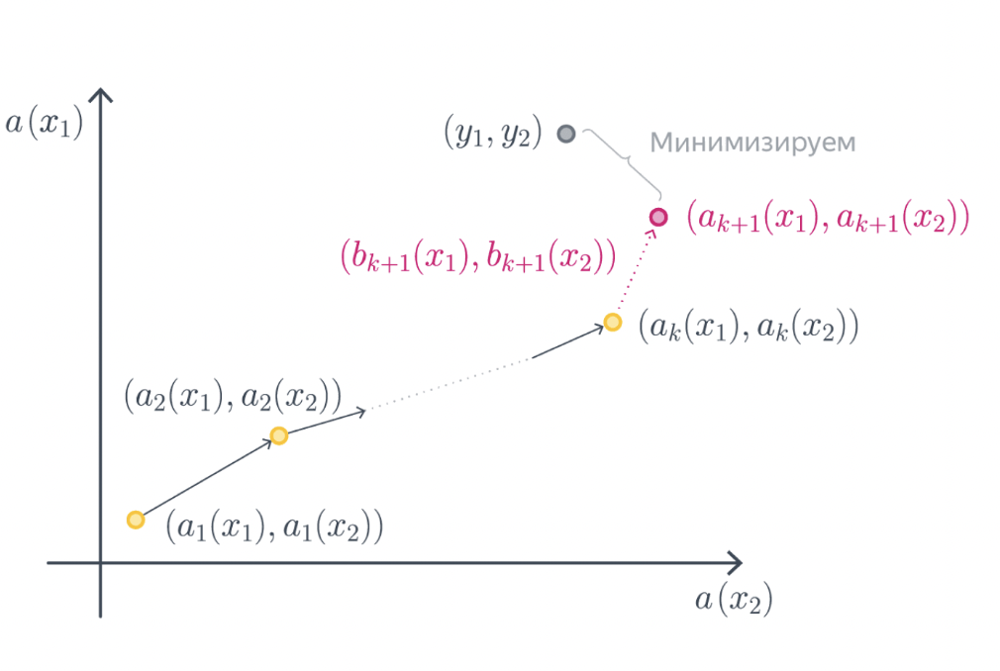

Бустинг самый мощный ансамбль для классических задач, однако и у него есть проблемы

#### Переобучение

Очевидно, что такая модель подвержена переобучению, однако можно ввести параметр тема обучения:

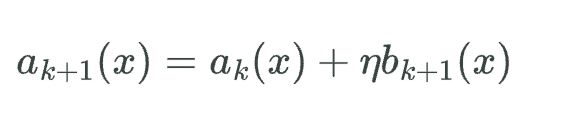

И тогда наш алгоритм будет выглядить так:

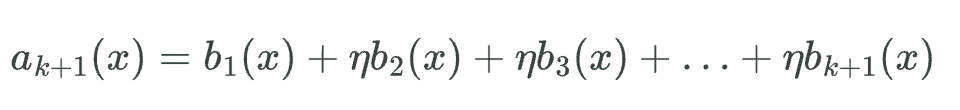

Кстати CatBoost сам подбирает этот параметр :)

#### Непонятно какие фичи важные

Однако можно заметить, что фичи на более верхних уровнях более важны, поэтому можно работать с первой частью ансамбля. Важность всех фич деревьев верхний уровней можно усреднить и получить оценку этой важности для всего алгоритма. Этот метод называют MDI (mean decrease in impurity).

Кстати в CatBoost это делается автоматически :)

Хороших реализаций градиентного бустинга есть, как минимум, три: LightGBM, XGBoost и CatBoost. 
Исторически они отличались довольно сильно, но за последние годы успели скопировать друг у друга все хорошие идеи.

Во многих компаниях, так или иначе связанных с ML, он используется для всех задач, которые не связаны с однородными данными (картинками, текстами, etc). Типичный поисковый запрос в Яндексе, выбор отеля на Booking.com или сериала на вечер в Netflix задействует несколько десятков моделей GBDT.

Впрочем, в будущем можно ожидать плавного исчезновения этого подхода, так как улучшение архитектур глубинного обучения и дальнейшее развитие железа нивелирует его преимущество по сравнению с нейросетями.

#### А почему CatBoost вообще выделяется?

Потому что под капотом катбуста куча оптимизаций, которые обычно делают руками и это может стать слабым местом при разработке пайплайнов обучения, тк неопытный ресерчер может накосячить с какой то из состовляющих и свести на нет все преимущества ансамбля :(

Так же в катбусте есть вот такое:

- Упорядоченное target-кодирование категориальных признаков с большим числом значений (параметр one_hot_max_size)

- Использование решающих таблиц (параметр по умолчанию grow_policy='SymmetricTree')

- Разделение ветвей не только по отдельным признакам, но и по их комбинациям (параметр max_ctr_complexity)

- Упорядоченный бустинг (параметр boosting_type='Ordered') для датасетов небольшого размера

- Возможность работы с текстовыми признаками (параметр text_features метода fit) с помощью bag-of-words

- Возможность обучения на GPU (параметр task_type='GPU' в методе fit), хотя это может сказаться на качестве

Короч, топ за свои бабки

## Кросс-валидация

До сих пор мы знали только один метод разделения выборки на train и val/test части:

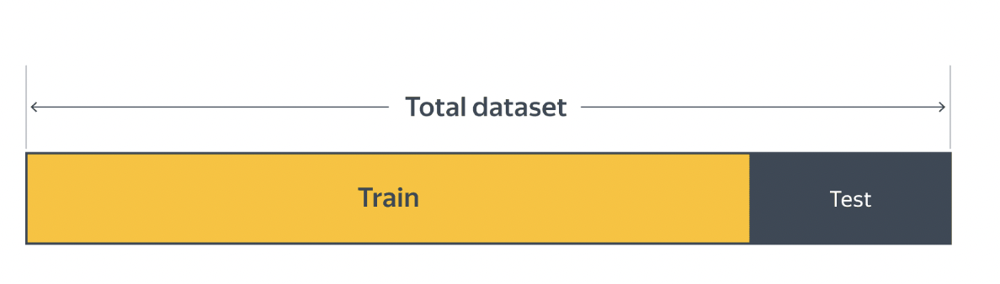

In [19]:
import numpy as np
from sklearn.model_selection import train_test_split
from collections import Counter
 
X, y = np.arange(1000).reshape((500, 2)), np.arange(500) % 5
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2,
    random_state=0
)
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, 
    test_size=0.1, 
    random_state=0
)
Counter(y), Counter(y_train), Counter(y_test)

(Counter({0: 100, 1: 100, 2: 100, 3: 100, 4: 100}),
 Counter({4: 77, 3: 75, 2: 75, 1: 70, 0: 63}),
 Counter({0: 27, 1: 22, 3: 19, 4: 17, 2: 15}))

Однако у этого метода есть замечательный аргумент **stratify**

In [20]:
import numpy as np
from sklearn.model_selection import train_test_split
from collections import Counter
 
X, y = np.arange(1000).reshape((500, 2)), np.arange(500) % 3
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    random_state=42,
    stratify=y
)

In [21]:
Counter(y), Counter(y_train), Counter(y_test)

(Counter({0: 167, 1: 167, 2: 166}),
 Counter({1: 134, 0: 133, 2: 133}),
 Counter({0: 34, 1: 33, 2: 33}))

### k-Fold

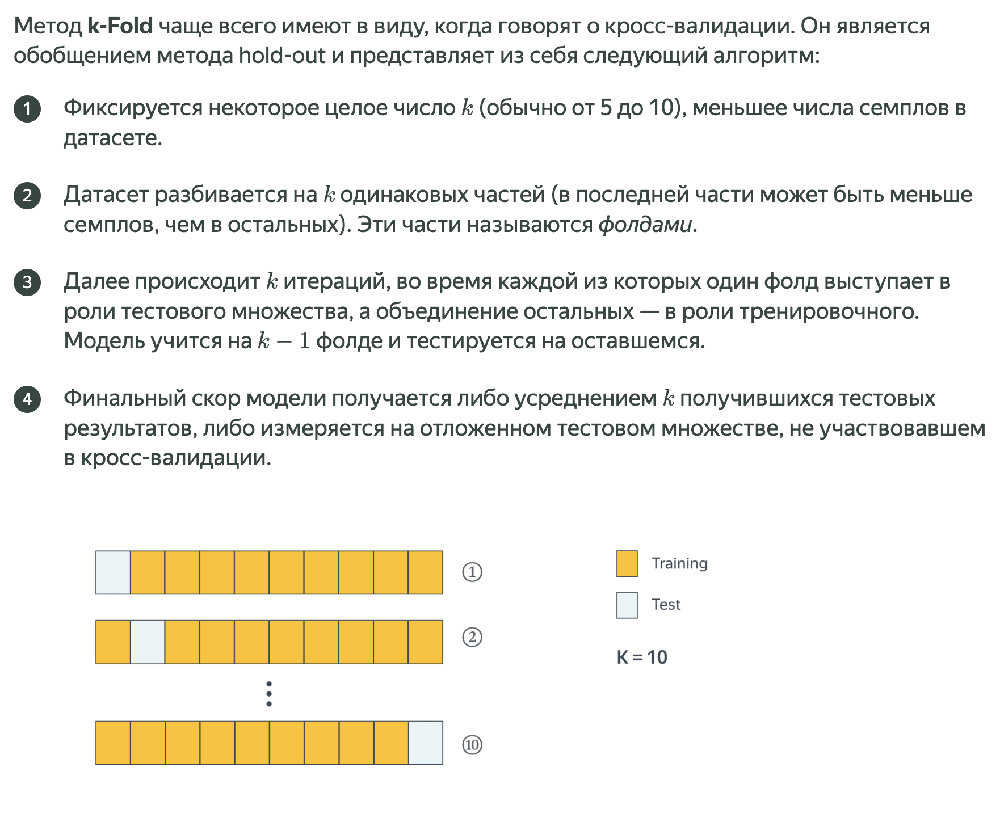

In [22]:
import numpy as np
from sklearn.model_selection import KFold
 
X = np.array([[1, 2, 3], [4, 5, 6], [7, 8, 9], [10, 11, 12]])
y = np.array([1, 2, 3, 4])
kf = KFold(n_splits=2)
 
for train_index, test_index in kf.split(X):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

TRAIN: [2 3] TEST: [0 1]
TRAIN: [0 1] TEST: [2 3]


Стоит отметить, что стратификация есть и у k-Fold

In [24]:
import numpy as np
from sklearn.model_selection import StratifiedKFold
 
X = np.array([[1, 2], [3, 4], [1, 2], [3, 4]])
y = np.array([0, 0, 1, 1])
skf = StratifiedKFold(n_splits=2)
 
for train_index, test_index in skf.split(X, y):
    print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

TRAIN: [1 3] TEST: [0 2]
TRAIN: [0 2] TEST: [1 3]


## Стэкинг

Стекинг (stacking) — алгоритм ансамблирования, основные отличия которого от предыдущих состоят в следующем:

1. Он может использовать алгоритмы разного типа, а не только из какого-то фиксированного семейства. Например, в качестве базовых алгоритмов могут выступать метод ближайших соседей и линейная регрессия
2. Результаты базовых алгоритмов объединяются в один с помощью обучаемой мета-модели, а не с помощью какого-либо обычного способа агрегации (суммирования или усреднения)

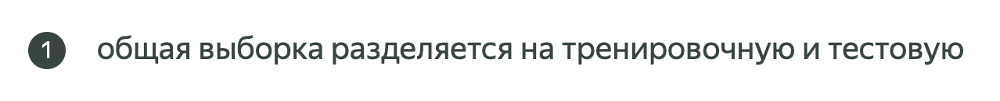

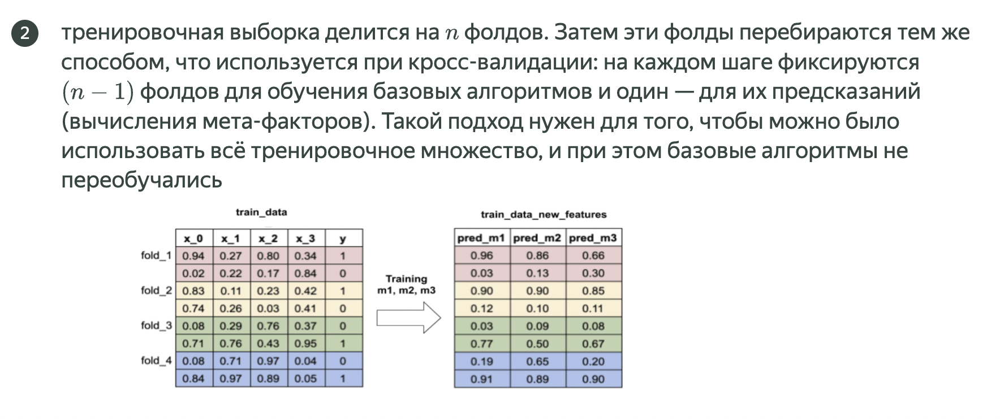

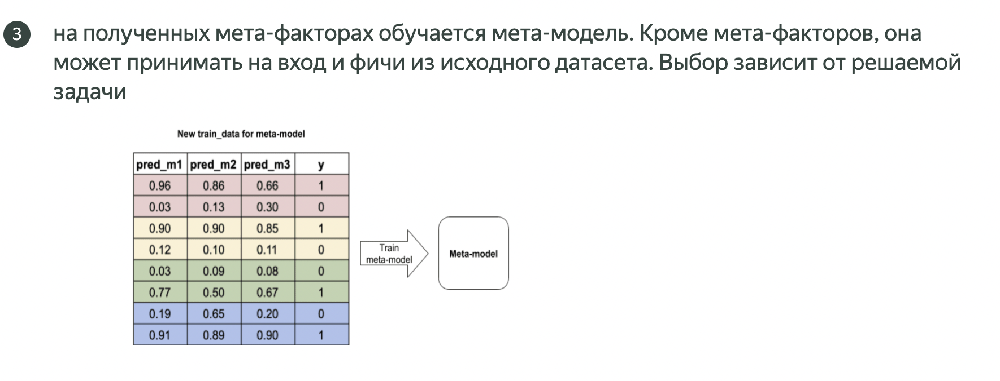

# Code time

In [40]:
import pandas as pd

dt = pd.read_csv('assets/UTKFACE_ALL.csv')
dt.head(10)

,age,gender,race,x_0,x_1,x_2,x_3,x_4,x_5,x_6,...,x_502,x_503,x_504,x_505,x_506,x_507,x_508,x_509,x_510,x_511
0,9.0,1.0,2.0,-2.682841,3.849328,-0.195707,-1.396659,-1.043878,-3.257665,1.403769,...,1.919913,2.218007,-0.074922,1.292628,1.627610,0.626054,-0.858740,1.472561,-1.311637,-2.439225
1,36.0,0.0,1.0,1.253224,0.935258,1.122377,0.710303,0.422487,0.575970,-2.655325,...,1.207412,0.922558,-1.013725,1.244106,1.609247,-0.399408,-1.155549,0.586509,1.308064,0.047017
2,86.0,1.0,0.0,1.166699,0.615854,0.182351,0.907180,-3.400506,-1.125785,-0.290186,...,2.840219,-1.331979,-1.092817,-0.417775,-0.923268,-1.242437,1.062358,0.190252,0.646670,0.344747
3,26.0,1.0,0.0,-0.307014,-1.412567,-0.593930,-1.047978,-3.357823,-0.550054,-1.719751,...,-0.534362,-1.038794,-0.735880,1.757429,1.518398,1.178353,-1.556929,2.011521,-1.095107,-1.127636
4,1.0,1.0,2.0,1.251069,2.791223,-0.367533,-0.780614,-0.919057,-2.629908,0.144388,...,0.233152,0.273566,-1.299091,0.966427,0.945735,0.186544,1.339876,-0.094709,1.191134,-1.326407
5,52.0,0.0,1.0,0.582175,1.022024,0.795910,-1.786742,-1.649398,-2.308681,0.464163,...,2.289924,-0.399650,-0.470852,-1.366747,1.917980,-0.118782,-0.738240,-0.722696,0.469186,-0.067994
6,25.0,1.0,0.0,0.351098,0.541644,1.903550,-1.155236,-1.433214,-1.673328,0.221810,...,1.742263,-0.446293,-0.458182,-0.935230,-0.492546,-0.064371,0.908465,-0.073256,-1.007906,0.658598
7,16.0,0.0,0.0,-1.616824,1.508563,1.280509,1.614589,-0.288123,-2.469669,1.750584,...,2.742175,-1.513531,0.113302,-0.221341,2.033571,0.018664,1.192496,0.043598,1.301671,-2.365092
8,27.0,0.0,3.0,1.383834,0.826539,-1.064926,0.996477,-3.146417,-1.297930,0.863481,...,1.002177,-1.159299,0.342349,-0.416681,-0.094583,-0.983699,0.185046,0.286523,-0.166914,0.507891
9,36.0,0.0,3.0,0.754030,-0.161773,1.737329,-0.433778,-0.898506,-1.163906,-0.626504,...,1.996916,-0.063907,-0.396011,1.335718,-0.422801,-1.631245,0.846011,-0.082281,2.014929,-1.112276


In [41]:
dt.shape

(23705, 515)

<Axes: >

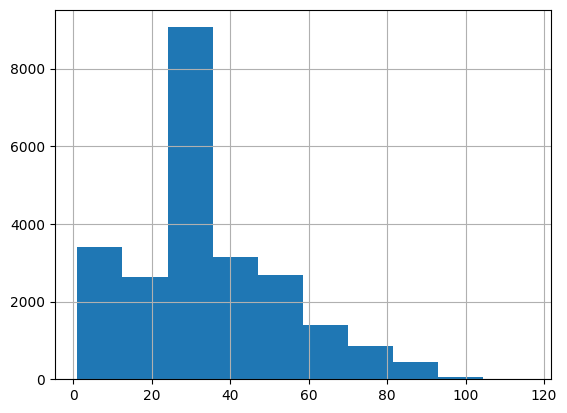

In [42]:
dt['age'].hist()

<Axes: >

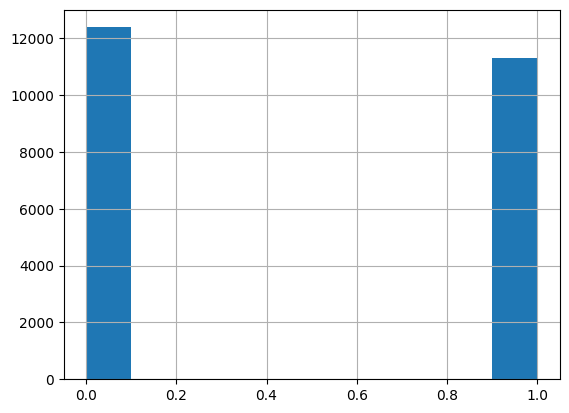

In [43]:
dt['gender'].hist()

<Axes: >

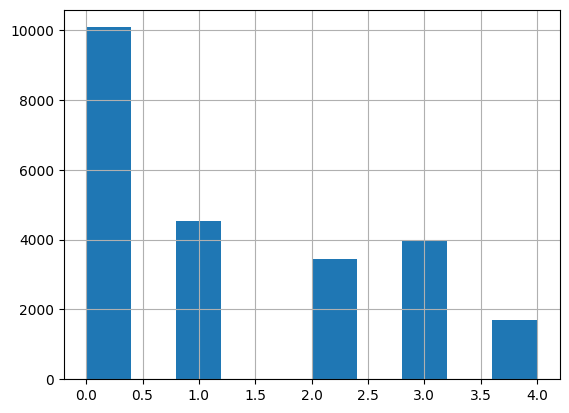

In [44]:
dt['race'].hist()

In [45]:
dt_train, dt_test = train_test_split(
    dt, 
    train_size=20000,
    random_state=32
)

In [46]:
dt_train.shape

(20000, 515)

In [47]:
dt_test.shape

(3705, 515)

In [49]:
dt_train.to_csv('assets/utk_vecs_train.csv', index=False)
dt_test.to_csv('assets/utk_vecs_test.csv', index=False)

In [51]:
dt_test.drop(['age', 'race', 'gender'], axis=1).to_csv('assets/utk_vecs_test_wo_target.csv', index=False)

In [72]:
from catboost import CatBoostClassifier, CatBoostRegressor
from sklearn.ensemble import StackingRegressor, StackingClassifier
from sklearn.linear_model import Ridge, LogisticRegression, Lasso
from sklearn.svm import SVC, SVR
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.metrics import mean_absolute_error, accuracy_score

model = Ridge()

model.fit(
    dt_train.drop(['age', 'race', 'gender'], axis=1).values,
    dt_train['age'].values
)

predictions = model.predict(
    dt_test.drop(['age', 'race', 'gender'], axis=1).values
)

mean_absolute_error(predictions, dt_test['age'].values)

7.099155821852708

In [60]:
mean_absolute_error(
    model.predict(
        dt_train.drop(['age', 'race', 'gender'], axis=1).values
    ),
    dt_train['age'].values
)

7.051889918403444

In [58]:
model = CatBoostRegressor(verbose=False)

model.fit(
    dt_train.drop(['age', 'race', 'gender'], axis=1).values,
    dt_train['age'].values
)

predictions = model.predict(
    dt_test.drop(['age', 'race', 'gender'], axis=1).values
)

mean_absolute_error(predictions, dt_test['age'].values)

6.700997812265058

In [57]:
mean_absolute_error(
    model.predict(
        dt_train.drop(['age', 'race', 'gender'], axis=1).values
    ),
    dt_train['age'].values
)

4.337310863830199

In [73]:
models = [
    ('ridge', Ridge()),
    ('lasso', Lasso()),
    ('catboost', CatBoostRegressor(verbose=False)),
    ('kmeans', KNeighborsRegressor())
]

# meta_model = CatBoostRegressor(verbose=True)

# ensemble = StackingRegressor(
#     estimators=models,
#     final_estimator=meta_model,
#     verbose=True
# )

In [74]:
predictions = []

for name, model in models:
    print(f'fitting {name}')
    model.fit(
        dt_train.drop(['age', 'race', 'gender'], axis=1).values,
        dt_train['age'].values
    )
    predictions.append(
        model.predict(
            dt_test.drop(['age', 'race', 'gender'], axis=1).values
        )
    )

predictions = sum(predictions) / len(predictions)

fitting ridge
fitting lasso
fitting catboost
fitting kmeans


In [76]:
mean_absolute_error(predictions, dt_test['age'].values)

6.613419983511491

In [77]:
models = [
    ('log_reg', LogisticRegression()),
    ('catboost', CatBoostClassifier(verbose=False)),
    ('kmeans', KNeighborsClassifier())
]

In [78]:
predictions = []

for name, model in models:
    print(f'fitting {name}')
    model.fit(
        dt_train.drop(['age', 'race', 'gender'], axis=1).values,
        dt_train['gender'].values
    )
    predictions.append(
        model.predict_proba(
            dt_test.drop(['age', 'race', 'gender'], axis=1).values
        )
    )

predictions = sum(predictions) / len(predictions)
predictions = np.argmax(predictions, axis=1)

fitting log_reg


/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


fitting catboost
fitting kmeans


In [79]:
accuracy_score(predictions, dt_test['gender'].values)

0.9211875843454791

In [80]:
models = [
    ('log_reg', LogisticRegression()),
    ('catboost', CatBoostClassifier(verbose=False)),
    ('kmeans', KNeighborsClassifier())
]

In [81]:
predictions = []

for name, model in models:
    print(f'fitting {name}')
    model.fit(
        dt_train.drop(['age', 'race', 'gender'], axis=1).values,
        dt_train['race'].values
    )
    predictions.append(
        model.predict_proba(
            dt_test.drop(['age', 'race', 'gender'], axis=1).values
        )
    )

predictions = sum(predictions) / len(predictions)
predictions = np.argmax(predictions, axis=1)

fitting log_reg


/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


fitting catboost
fitting kmeans


In [82]:
accuracy_score(predictions, dt_test['race'].values)

0.8175438596491228

#### Как тюнить одну модельку

In [94]:
from sklearn.model_selection import GridSearchCV

model = LogisticRegression()

grid = {
    'C': [0.1, 1.0, 10.0, 100.0]
}

search = GridSearchCV(
    estimator=model,
    param_grid=grid,
    scoring='accuracy',
)

search.fit(
    dt_train.drop(['age', 'race', 'gender'], axis=1).values,
    dt_train['gender'].values
)

/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

GridSearchCV(estimator=LogisticRegression(),
             param_grid={'C': [0.1, 1.0, 10.0, 100.0]}, scoring='accuracy')

In [95]:
search.cv_results_

{'mean_fit_time': array([1.65103855, 1.38623786, 1.43953571, 1.55123978]),
 'std_fit_time': array([0.23673106, 0.23129771, 0.31223036, 0.22772729]),
 'mean_score_time': array([0.01037207, 0.00481887, 0.00724502, 0.00674253]),
 'std_score_time': array([0.01027278, 0.00244877, 0.00128753, 0.00311858]),
 'param_C': masked_array(data=[0.1, 1.0, 10.0, 100.0],
              mask=[False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'C': 0.1}, {'C': 1.0}, {'C': 10.0}, {'C': 100.0}],
 'split0_test_score': array([0.9145 , 0.9135 , 0.91425, 0.91525]),
 'split1_test_score': array([0.916  , 0.916  , 0.9165 , 0.91725]),
 'split2_test_score': array([0.9015 , 0.90175, 0.9015 , 0.9015 ]),
 'split3_test_score': array([0.90975, 0.90975, 0.9105 , 0.91   ]),
 'split4_test_score': array([0.91825, 0.919  , 0.91925, 0.91925]),
 'mean_test_score': array([0.912  , 0.912  , 0.9124 , 0.91265]),
 'std_test_score': array([0.00594348, 0.00595609, 0.00615752, 0.00636907]),
 '

In [96]:
search.best_score_

0.91265

In [97]:
model = search.best_estimator_
predictions = model.predict(
    dt_test.drop(['age', 'race', 'gender'], axis=1).values
)
accuracy_score(predictions, dt_test['gender'].values)

0.9163292847503374

In [98]:
model = LogisticRegression()

model.fit(
    dt_train.drop(['age', 'race', 'gender'], axis=1).values,
    dt_train['gender'].values
)

predictions = model.predict(
    dt_test.drop(['age', 'race', 'gender'], axis=1).values
)

accuracy_score(predictions, dt_test['gender'].values)

/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.9152496626180837